# Разметка датасета в формате COCO
#### [датасет](https://app.roboflow.com/mlcoco/cigarette-vf5kz)

In [1]:
! pip install -q -U pip pycocotools pandas scikit-image matplotlib

In [2]:
import pandas as pd 
import os
from pycocotools.coco import COCO
import skimage.io as io
import matplotlib.pyplot as plt
from pathlib import Path

### Читаем датасет

In [3]:
dataDir=Path('../data/coco/train')
annFile = Path('../data/coco/train/_annotations.coco.json')

In [4]:
coco = COCO(annFile)
imgIds = coco.getImgIds()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [5]:
image_id = coco.getImgIds()
cats = coco.loadCats(coco.getCatIds())
categories = [cat['name'] for cat in cats]
print(f"Количество категорий: {len(categories)}")
print("Категории:")
print(categories)

Количество категорий: 2
Категории:
['cigarette-butt', 'cigarette-butt']


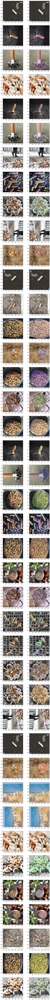

In [6]:
imgs = coco.loadImgs(image_id[:])
_,axs = plt.subplots(len(imgs),2,figsize=(10,5 * len(imgs)))
for img, ax in zip(imgs, axs):
    I = io.imread(dataDir/img['file_name'])
    annIds = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annIds)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=False)